In [1]:
import pandas as pd

import plotly.express as px

In [14]:
df = pd.read_csv("Africa_climate_change.csv")

In [15]:
df.head()

,DATE,PRCP,TAVG,TMAX,TMIN,COUNTRY
0,19800101 000000,NaN,54.0,61.0,43.0,Tunisia
1,19800101 000000,NaN,49.0,55.0,41.0,Tunisia
2,19800101 000000,0.0,72.0,86.0,59.0,Cameroon
3,19800101 000000,NaN,50.0,55.0,43.0,Tunisia
4,19800101 000000,NaN,75.0,91.0,NaN,Cameroon


In [16]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 464815 entries, 0 to 464814
Data columns (total 6 columns):
 #   Column   Non-Null Count   Dtype  
---  ------   --------------   -----  
 0   DATE     464815 non-null  object 
 1   PRCP     177575 non-null  float64
 2   TAVG     458439 non-null  float64
 3   TMAX     363901 non-null  float64
 4   TMIN     332757 non-null  float64
 5   COUNTRY  464815 non-null  object 
dtypes: float64(4), object(2)
memory usage: 21.3+ MB


In [17]:
df.describe(include = 'all')

,DATE,PRCP,TAVG,TMAX,TMIN,COUNTRY
count,464815,177575.000000,458439.000000,363901.000000,332757.000000,464815
unique,15938,NaN,NaN,NaN,NaN,5
top,20150619 000000,NaN,NaN,NaN,NaN,Senegal
freq,37,NaN,NaN,NaN,NaN,183262
mean,NaN,0.120941,77.029838,88.713969,65.548262,NaN
std,NaN,0.486208,11.523634,13.042631,11.536547,NaN
min,NaN,0.000000,-49.000000,41.000000,12.000000,NaN
25%,NaN,0.000000,70.000000,81.000000,58.000000,NaN
50%,NaN,0.000000,80.000000,90.000000,68.000000,NaN
75%,NaN,0.010000,85.000000,99.000000,74.000000,NaN


In [18]:
df["DATE"] = pd.to_datetime(df["DATE"])

In [20]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 464815 entries, 0 to 464814
Data columns (total 6 columns):
 #   Column   Non-Null Count   Dtype         
---  ------   --------------   -----         
 0   DATE     464815 non-null  datetime64[ns]
 1   PRCP     177575 non-null  float64       
 2   TAVG     458439 non-null  float64       
 3   TMAX     363901 non-null  float64       
 4   TMIN     332757 non-null  float64       
 5   COUNTRY  464815 non-null  object        
dtypes: datetime64[ns](1), float64(4), object(1)
memory usage: 21.3+ MB


In [21]:
df['TMAX'].fillna(df['TMAX'].mean(), inplace=True)
df['TMIN'].fillna(df['TMIN'].mean(), inplace=True)

C:\Users\HP\AppData\Local\Temp\ipykernel_7072\2255586170.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['TMAX'].fillna(df['TMAX'].mean(), inplace=True)
C:\Users\HP\AppData\Local\Temp\ipykernel_7072\2255586170.py:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, 

In [31]:
df = df.dropna(subset=['TAVG']) 

In [24]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 458439 entries, 0 to 464814
Data columns (total 6 columns):
 #   Column   Non-Null Count   Dtype         
---  ------   --------------   -----         
 0   DATE     458439 non-null  datetime64[ns]
 1   PRCP     173081 non-null  float64       
 2   TAVG     458439 non-null  float64       
 3   TMAX     458439 non-null  float64       
 4   TMIN     458439 non-null  float64       
 5   COUNTRY  458439 non-null  object        
dtypes: datetime64[ns](1), float64(4), object(1)
memory usage: 24.5+ MB


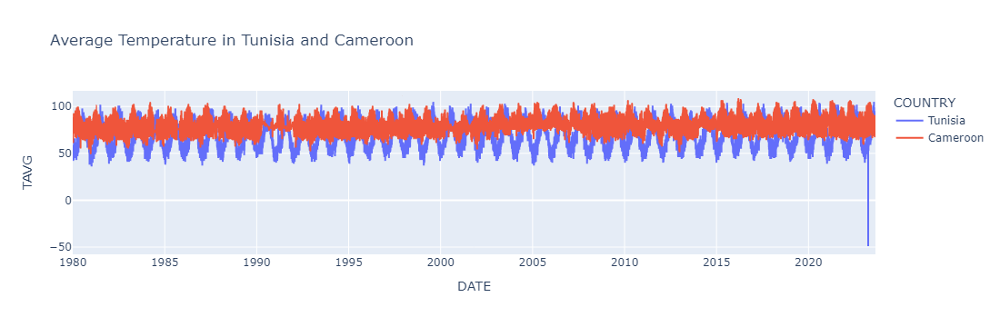

In [28]:
df_filtered = df[df['COUNTRY'].isin(['Tunisia', 'Cameroon'])]

fig = px.line(df_filtered, x='DATE', y='TAVG', color='COUNTRY', title='Average Temperature in Tunisia and Cameroon')

fig.show()

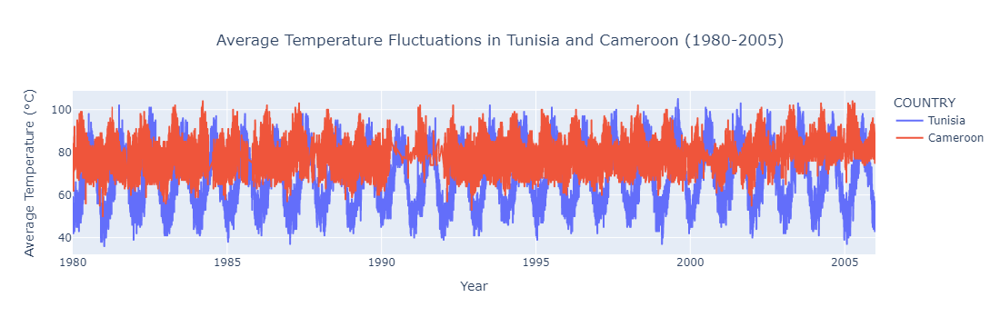

In [29]:
df_filtered = df[(df['COUNTRY'].isin(['Tunisia', 'Cameroon'])) & (df['DATE'].dt.year >= 1980) & (df['DATE'].dt.year <= 2005)]

fig = px.line(df_filtered, 
              x='DATE', 
              y='TAVG', 
              color='COUNTRY', 
              title='Average Temperature Fluctuations in Tunisia and Cameroon (1980-2005)')

fig.update_layout(
    xaxis_title='Year',
    yaxis_title='Average Temperature (°C)',
    title_x=0.5)

fig.show()


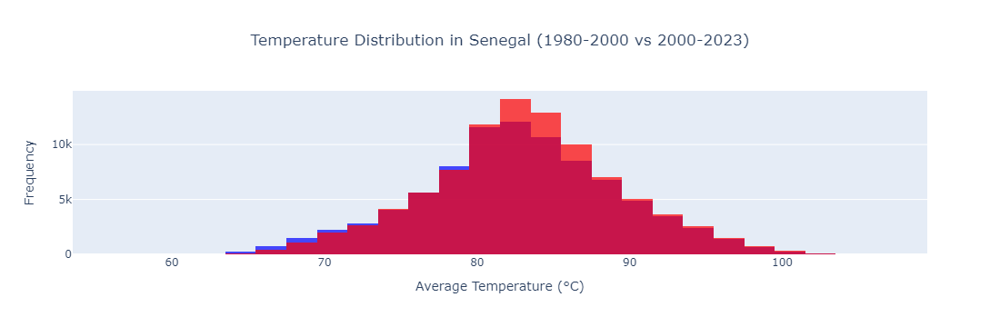

In [30]:
df_senegal_1980_2000 = df[(df['COUNTRY'] == 'Senegal') & (df['DATE'].dt.year >= 1980) & (df['DATE'].dt.year <= 2000)]
df_senegal_2000_2023 = df[(df['COUNTRY'] == 'Senegal') & (df['DATE'].dt.year > 2000) & (df['DATE'].dt.year <= 2023)]

fig = px.histogram(df_senegal_1980_2000, 
                   x='TAVG', 
                   nbins=30, 
                   opacity=0.7, 
                   color_discrete_sequence=['blue'], 
                   labels={'TAVG': 'Average Temperature (°C)'}, 
                   title="Temperature Distribution in Senegal (1980-2000 vs 2000-2023)")

fig.add_trace(px.histogram(df_senegal_2000_2023, 
                           x='TAVG', 
                           nbins=30, 
                           opacity=0.7, 
                           color_discrete_sequence=['red']).data[0])

fig.update_layout(
    barmode='overlay',  # Overlay the histograms
    xaxis_title='Average Temperature (°C)',
    yaxis_title='Frequency',
    title_x=0.5,  # Center the title
    legend_title_text='Time Period',
    legend=dict( itemsizing='constant', orientation="h", x=0.5, xanchor='center') )

fig.data[0].name = '1980-2000'
fig.data[1].name = '2000-2023'

fig.show()


From the graph, it is clear that the 2000-2023 data shows a higher frequency of temperatures above 80°C, suggesting that there were more occurrences of higher average temperatures during this period.
The 1980-2000 data has fewer instances of extremely high temperatures compared to the more recent period.